In [2]:
! pip install -r requirements.txt

    100% |████████████████████████████████| 1.6MB 1.3MB/s ta 0:00:01
  Using cached https://files.pythonhosted.org/packages/e6/98/8bf5ea39a3385cc806ba1146a280a113835e5df3b0ad25ca95eea8352040/wavio-0.0.4-py2.py3-none-any.whl
    100% |████████████████████████████████| 276kB 1.7MB/s ta 0:00:01
  Running setup.py bdist_wheel for librosa ... done
  Stored in directory: /Users/rafalpilarczyk/Library/Caches/pip/wheels/18/b8/10/f0f8f6ac60668a5cd75596cf14c25bb6b3ea1ecd815f058b7e
  Running setup.py bdist_wheel for sklearn ... done
  Stored in directory: /Users/rafalpilarczyk/Library/Caches/pip/wheels/76/03/bb/589d421d27431bcd2c6da284d5f2286c8e3b2ea3cf1594c074
Successfully built librosa sklearn
You are using pip version 10.0.1, however version 18.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


# Install and import libraries

In [3]:
import os
import librosa
import numpy as np
import wavio

%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

from sklearn.mixture import GaussianMixture

import pickle

In [4]:
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')

# Dataset preprocessing

In this example dataset consists of 4 audio-mixture activites: driving car, using phone, not-using phone, running/walking activities

In [337]:
DATASET_DIR = './dataset-annotated'

In [338]:
classes = os.listdir(DATASET_DIR)
classes = [na for na in classes if na[0]!='.']
print(classes)

['car', 'using', 'not-using', 'activities']


In [339]:
os.listdir(os.path.join(DATASET_DIR, classes[0]))

['car-radio-talk.wav',
 'car-noradio-talk.wav.f',
 'car-noradio-talk.wav',
 'car-6.wav',
 'car-5.wav.f',
 'car-4.wav',
 'car-5.wav',
 'car-3.wav.f',
 'car-3.wav',
 'car-4.wav.f',
 'car-talking.wav.f',
 'car-6.wav.f',
 'car-talking.wav',
 'car-radio-talk.wav.f']

## Dataset Visualisation

In [340]:
sample = wavio.read(os.path.join(DATASET_DIR, classes[0], 'car-radio-talk.wav'))
sr = sample.rate
x = sample.data[:,0]

### Reading audio

In [151]:
def readwav(path):
    Struct = wavio.read(path)
    wav = Struct.data.astype(float) / np.power(2, Struct.sampwidth * 8 - 1)
    fs = Struct.rate
    return wav[:, 0], fs

### Plot audio with librosa

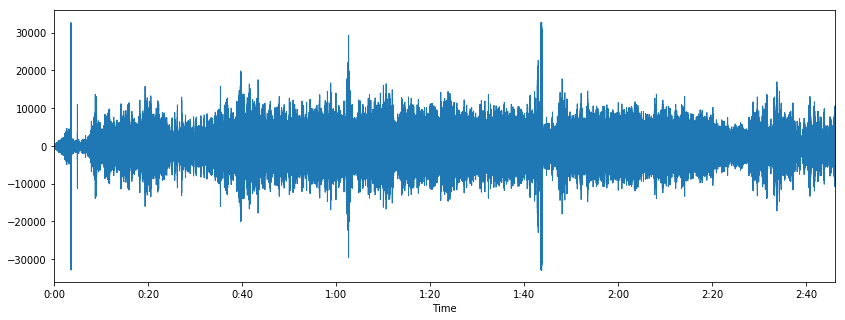

In [91]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

### plot STFT with librosa

(1025, 5193)


/Users/rafalpilarczyk/anaconda3/envs/tensorflow/lib/python3.6/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


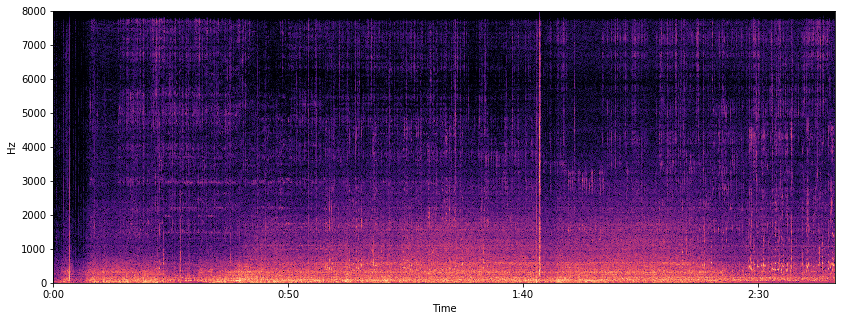

In [118]:
X = librosa.stft(x)
print(X.shape)

Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')

In [78]:
def display_samples(x, sr):
    X = librosa.stft(x)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(14, 5))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar(format='%+2.0f dB')
    plt.tight_layout()
    plt.show()

In [100]:
ipd.Audio(x, rate=sr) 

### Display samples in loop

sample-noise-doing.wav


/Users/rafalpilarczyk/anaconda3/envs/tensorflow/lib/python3.6/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


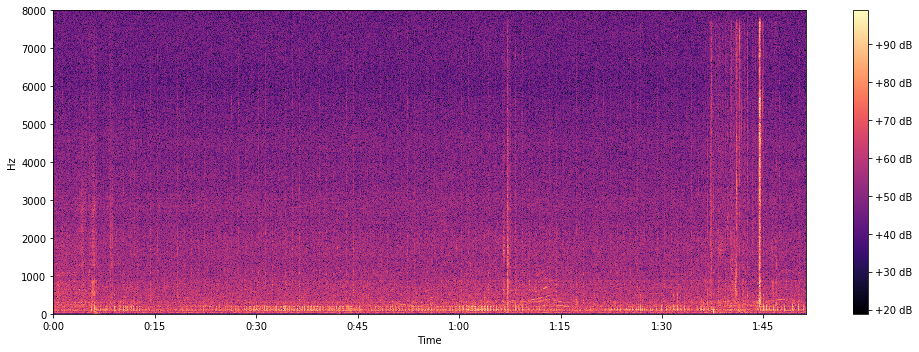

sample-noise-sleeping.wav


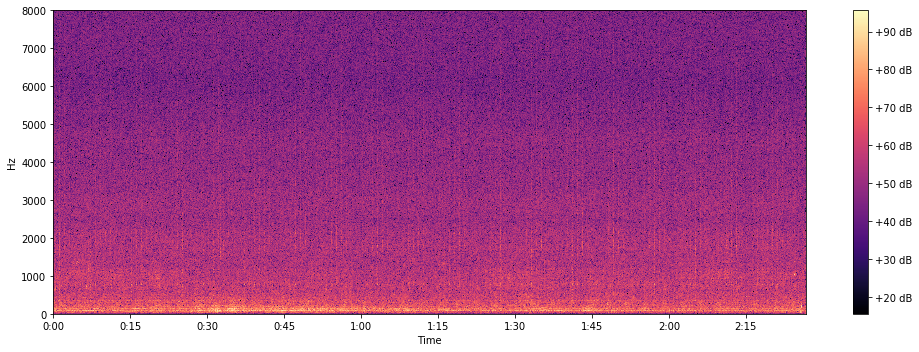

In [80]:
for fl in os.listdir('./sample-noises'):
    
    a, sr = load_wav(os.path.join('./sample-noises', fl))
    print(fl)
    display_samples(a, sr)
    

In [7]:
### display MFCC

In [103]:
mfccs = librosa.feature.mfcc(y=x, sr=sr, n_mfcc=32)

/Users/rafalpilarczyk/anaconda3/envs/tensorflow/lib/python3.6/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


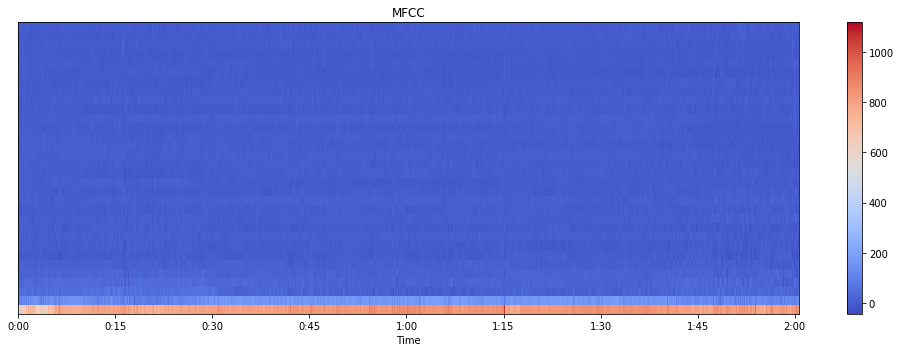

In [108]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar()
plt.title('MFCC')
plt.tight_layout()

### Display mfcc-delta features

/Users/rafalpilarczyk/anaconda3/envs/tensorflow/lib/python3.6/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


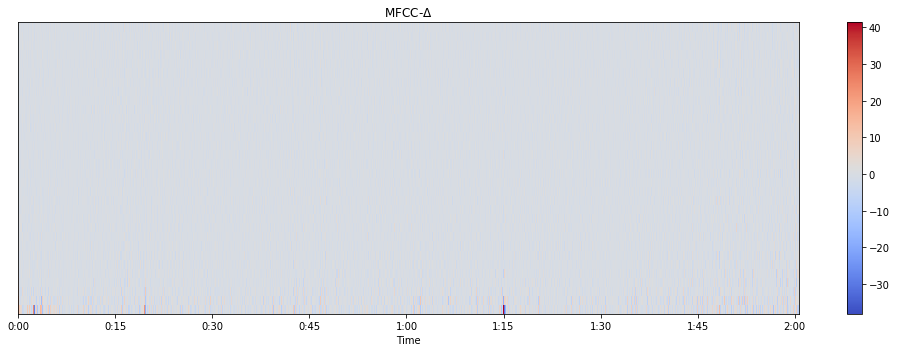

In [109]:
mfcc_delta = librosa.feature.delta(mfccs)

plt.figure(figsize=(14, 5))
librosa.display.specshow(mfcc_delta, x_axis='time')
plt.colorbar()
plt.title(r'MFCC-$\Delta$')
plt.tight_layout()

/Users/rafalpilarczyk/anaconda3/envs/tensorflow/lib/python3.6/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


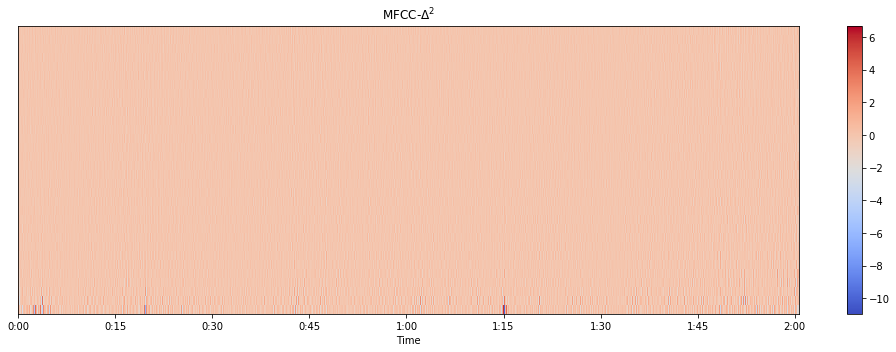

In [110]:
mfcc_delta2 = librosa.feature.delta(mfccs, order=2)

plt.figure(figsize=(14, 5))
librosa.display.specshow(mfcc_delta2, x_axis='time')
plt.colorbar()
plt.title(r'MFCC-$\Delta^2$')
plt.tight_layout()

### Display mel-spectrogram

(128, 5193)


/Users/rafalpilarczyk/anaconda3/envs/tensorflow/lib/python3.6/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


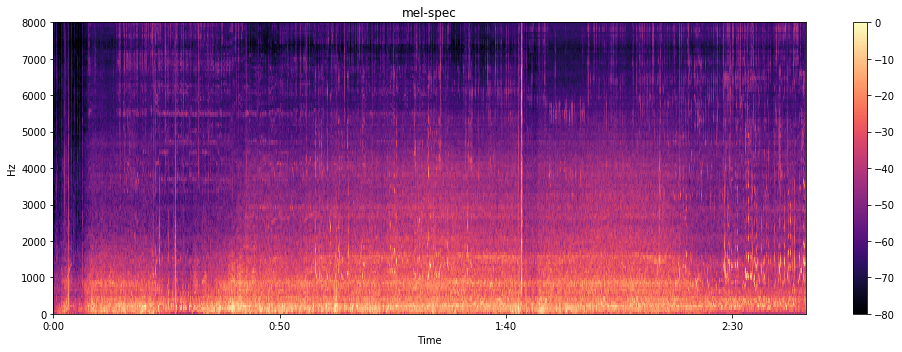

In [117]:
spec = librosa.feature.melspectrogram(x, sr)

spec = librosa.power_to_db(spec,ref=np.max)
print(spec.shape)

plt.figure(figsize=(14, 5))
librosa.display.specshow(spec, sr=sr, x_axis='time', y_axis='hz')
    
plt.colorbar()
plt.title(r'mel-spec')
plt.tight_layout()

In [125]:
def display_samples_logspec(x, sr):
    
    spec = librosa.feature.melspectrogram(x, sr)

    spec = librosa.power_to_db(spec,ref=np.max)

    plt.figure(figsize=(14, 5))
    librosa.display.specshow(spec, sr=sr, x_axis='time', y_axis='hz')

    plt.colorbar()
    plt.title(r'mel-spec')
    plt.tight_layout()
    plt.show()

In [127]:
def display_samples_mfcc(x, sr):
    
    
    mfccs = librosa.feature.mfcc(y=x, sr=sr, n_mfcc=32)

    plt.figure(figsize=(14, 5))
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar()
    plt.title('MFCC')
    plt.tight_layout()
    plt.show()
    
    mfcc_delta = librosa.feature.delta(mfccs)

    plt.figure(figsize=(14, 5))
    librosa.display.specshow(mfcc_delta, x_axis='time')
    plt.colorbar()
    plt.title(r'MFCC-$\Delta$')
    plt.tight_layout()

    plt.show()
    
    mfcc_delta2 = librosa.feature.delta(mfccs, order=2)

    plt.figure(figsize=(14, 5))
    librosa.display.specshow(mfcc_delta2, x_axis='time')
    plt.colorbar()
    plt.title(r'MFCC-$\Delta^2$')
    plt.tight_layout()
    plt.show()


sample-noise-doing.wav


/Users/rafalpilarczyk/anaconda3/envs/tensorflow/lib/python3.6/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


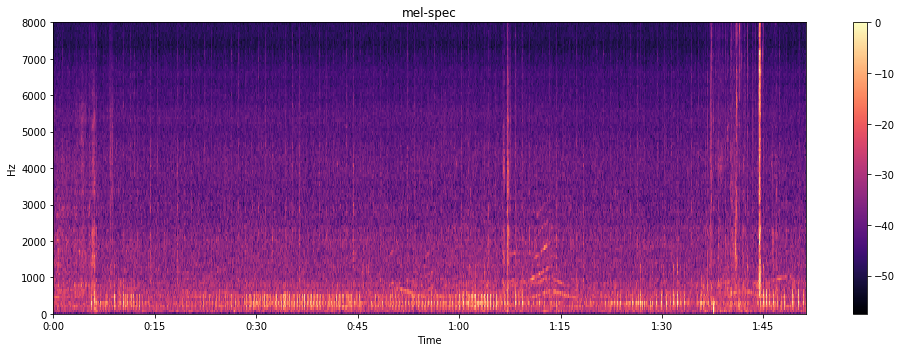

sample-noise-sleeping.wav


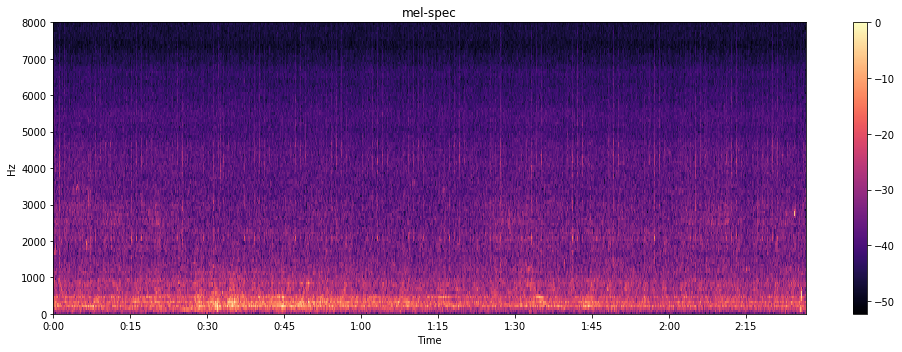

In [126]:
for fl in os.listdir('./sample-noises'):
    
    a, sr = load_wav(os.path.join('./sample-noises', fl))
    print(fl)
    display_samples_logspec(a, sr)
    

sample-noise-doing.wav


/Users/rafalpilarczyk/anaconda3/envs/tensorflow/lib/python3.6/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


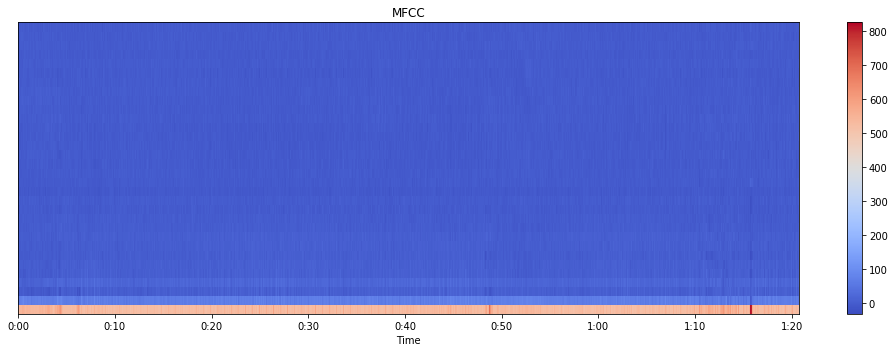

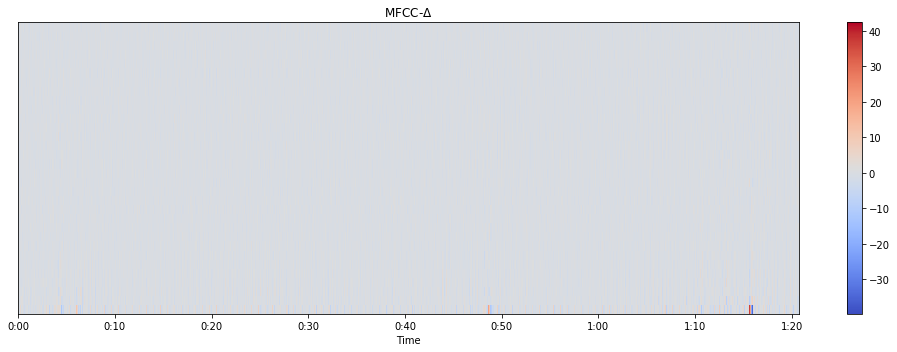

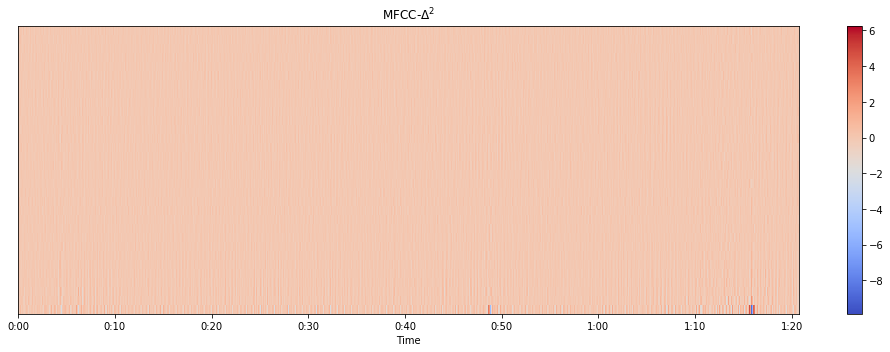

sample-noise-sleeping.wav


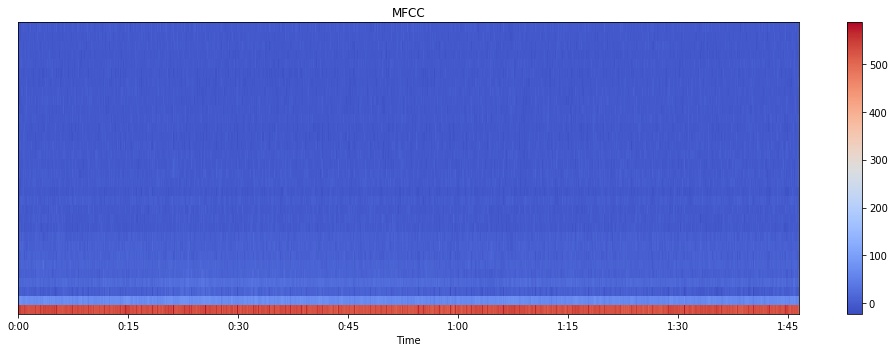

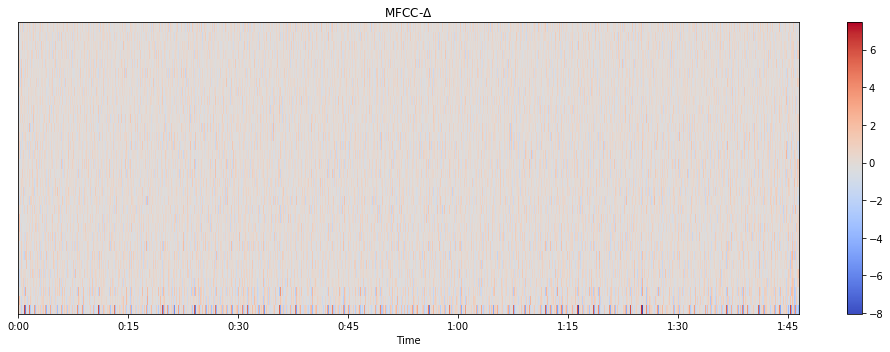

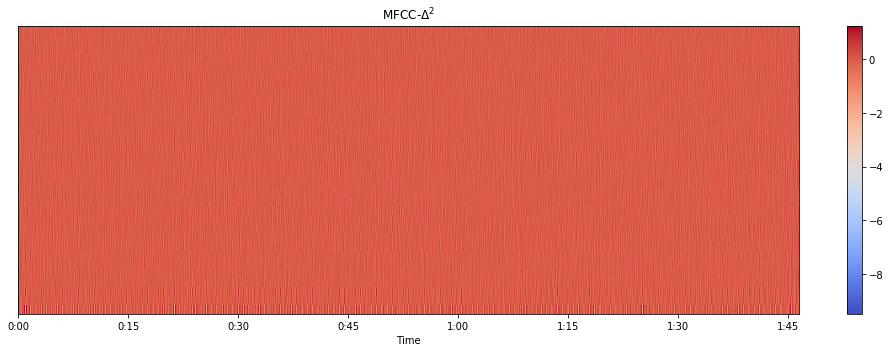

In [128]:
for fl in os.listdir('./sample-noises'):
    a, sr = load_wav(os.path.join('./sample-noises', fl))
    print(fl)
    display_samples_mfcc(a, sr)
    

## Feature preprocessing and storage

In [342]:
### feature extraction and saving on hard drive
def store_features(file_in, file_out, data, sr):
    mfccs = librosa.feature.mfcc(y=data, sr=sr, n_mfcc=32)
    mfccs = mfccs.T
    with open(file_out, 'wb') as handle:
        pickle.dump(mfccs, handle)

In [343]:
for _dir in classes:
    print(_dir)

car
using
not-using
activities


In [ ]:
dataset = os.listdir(os.path.join(DATASET_DIR, classes[0]))

dataset = [os.path.join(DATASET_DIR, _dir, _file) for _dir in classes for _file in os.listdir(os.path.join(DATASET_DIR, _dir)) if _file[-1]!='f']


In [345]:
!ls dataset-annotated/activities

running.wav            running2.wav.f         walking.wav
running.wav.f          shopping-walking.wav   walking.wav.f
running2.wav           shopping-walking.wav.f


In [ ]:
for _dt_file in dataset:
    x, sr = readwav(_dt_file)
    store_features(_dt_file, _dt_file+".f", x, sr)

In [346]:
def load_feature(feature_file):
    return pickle.load( open(feature_file, "rb" ) ) 

In [347]:
name = os.listdir(os.path.join(DATASET_DIR, classes[0]))[0]+".f"
name = os.path.join(DATASET_DIR, classes[0], name)

In [348]:
sam = load_feature(name)

In [349]:
sam.shape

(5193, 32)

In [350]:
# See https://github.com/yongxuUSTC/sednn/blob/master/mixture2clean_dnn/main_dnn.py

def mat_2d_to_3d(x, agg_num, hop):
    
    len_x, n_in = x.shape
    
    if (len_x < agg_num):
        x = np.concatenate((x, np.zeros((agg_num - len_x, n_in))))
        
    len_x = len(x)
    i1 = 0
    x3d = []
    while (i1 + agg_num <= len_x):
        x3d.append(x[i1 : i1 + agg_num])
        i1 += hop
    return np.array(x3d)

In [351]:
from random import shuffle

## Prepare Test-Train dataset (using shuffle and partitioning)

In [352]:
test = {}
train = {}

for _cls in classes:
    dataset = os.listdir(os.path.join(DATASET_DIR, _cls))
    dataset = [na for na in dataset if na[-1] == 'f']
    print(dataset)
    
    shuffle(dataset)
    _tst_files = int(0.2*(len(dataset)))+1 #tricky
    test[_cls] = []
    train[_cls] = []

    
    for i in range(_tst_files):
        test[_cls].append(os.path.join(DATASET_DIR, _cls, dataset[i]))
        
    for i in range(_tst_files, len(dataset)):
        train[_cls].append(os.path.join(DATASET_DIR, _cls, dataset[i]))


['car-noradio-talk.wav.f', 'car-5.wav.f', 'car-3.wav.f', 'car-4.wav.f', 'car-talking.wav.f', 'car-6.wav.f', 'car-radio-talk.wav.f']
['using-watching-2.wav.f', 'using-watching.wav.f', 'using-not-watching.wav.f', 'using-phone.wav.f', 'toilet.wav.f']
['not-using-sleeping-2.wav.f', 'not-using-television.wav.f', 'not-using-doing.wav.f', 'not-using-shopping.wav.f', 'not-using-activities.wav.f', 'not-using-4.wav.f', 'not-using-sleeping-3.wav.f', 'not-using-televiosion-2.wav.f', 'not-using-2.wav.f', 'not-using.wav.f', 'not-using-sleeping.wav.f', 'not-using-talking-tv.wav.f']
['running2.wav.f', 'running.wav.f', 'walking.wav.f', 'shopping-walking.wav.f']


In [354]:
def get_features_lst(dataset_files):
    ft_lst = []
    for _fl in dataset_files:
        feat = load_feature(_fl)
        ft_lst.append(feat)
        
    return np.concatenate(ft_lst)

# Prepare gaussian mixture for each class

In [ ]:
classifiers = {}
for key, val in train.items():
    cls = GaussianMixture(n_components=32, covariance_type='diag')
    
    _ds_feat = get_features_lst(val)
    cls.fit(_ds_feat)
    
    classifiers[key] = cls

In [486]:
classifiers #each activity class has own classifier

{'activities': GaussianMixture(covariance_type='diag', init_params='kmeans', max_iter=100,
         means_init=None, n_components=32, n_init=1, precisions_init=None,
         random_state=None, reg_covar=1e-06, tol=0.001, verbose=0,
         verbose_interval=10, warm_start=False, weights_init=None),
 'car': GaussianMixture(covariance_type='diag', init_params='kmeans', max_iter=100,
         means_init=None, n_components=32, n_init=1, precisions_init=None,
         random_state=None, reg_covar=1e-06, tol=0.001, verbose=0,
         verbose_interval=10, warm_start=False, weights_init=None),
 'not-using': GaussianMixture(covariance_type='diag', init_params='kmeans', max_iter=100,
         means_init=None, n_components=32, n_init=1, precisions_init=None,
         random_state=None, reg_covar=1e-06, tol=0.001, verbose=0,
         verbose_interval=10, warm_start=False, weights_init=None),
 'using': GaussianMixture(covariance_type='diag', init_params='kmeans', max_iter=100,
         means_init

# GMM Evaluation

In [490]:
CONTEXT_FEATURES_LEN = 500 #how many features (in time) we want to use as a context frame

In [493]:
def classify_chunks(chunks, classifiers_dic, g_truth):
    h = 0
    m = 0
    for _ds_feat in chunks:
        
        sc_max = float('-inf')
        cls_max = ''
        for cls, md in classifiers_dic.items():
            score = md.score(_ds_feat)
            if score > sc_max:
                sc_max = score
                cls_max = cls
        if cls_max == g_truth:
            h+=1
        else:
            m+=1
    return h/(h+m)

In [511]:
acc_lst = []
for key, val in test.items():
    print("KEY {}".format(key))
    for file in val:
        _ds_feat = get_features_lst([file])
        print(_ds_feat.shape)
        
        ctx_frames = np.array_split(_ds_feat, _ds_feat.shape[0]/CONTEXT_FEATURES_LEN)
        
        acc = classify_chunks(ctx_frames, classifiers, key)
        acc_lst.append(acc)  
        print(file, "\t", acc, "\n")
        
print(np.mean(acc_lst))

KEY car
(14163, 32)
./dataset-annotated/car/car-5.wav.f 	 1.0
(7978, 32)
./dataset-annotated/car/car-4.wav.f 	 1.0
KEY using
(3625, 32)
./dataset-annotated/using/using-watching-2.wav.f 	 1.0
(55104, 32)
./dataset-annotated/using/using-watching.wav.f 	 1.0
KEY not-using
(23364, 32)
./dataset-annotated/not-using/not-using-activities.wav.f 	 0.0
(25239, 32)
./dataset-annotated/not-using/not-using-televiosion-2.wav.f 	 0.0
(113065, 32)
./dataset-annotated/not-using/not-using-sleeping-2.wav.f 	 0.0
KEY activities
(60801, 32)
./dataset-annotated/activities/running.wav.f 	 0.0
0.5


# CNN Classifier

In [389]:
hopping_frames = 8
concat_frames = 32

In [390]:
from keras.utils import to_categorical

In [391]:
classes = train.keys()
cls_to_id = {cls : i for i, cls in enumerate(classes)}
to_categorical([0,1,1,1,1,1]) # how we could use keras utils

array([[1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [8]:
# prepare arrays for keras Train_x, Train_y using scaler

def read_dataset(dic_dataset, concat, hop, scaler):
    ds_x = []
    ds_y = []
    for key, val in dic_dataset.items():
        for sample in val:
            
            _ds_feat = load_feature(sample)
            _ds_feat = scaler.transform(_ds_feat)
            x = mat_2d_to_3d(_ds_feat, concat, hop)
            x = np.expand_dims(x, axis=-1)
            
            y = [cls_to_id[key]] * x.shape[0]
            ds_x.append(x)
            ds_y.append(y)
            
    return np.concatenate(ds_x), to_categorical(np.concatenate(ds_y))

## Scaler for features

we use standard scaler on training data and use also for evaluation for test data!

In [445]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler(with_mean=True, with_std=True)

In [446]:
def features_for_scaler(dic_dataset):
    ds_x = []
    for key, val in dic_dataset.items():
        for sample in val:
            
            _ds_feat = load_feature(sample)
            ds_x.append(_ds_feat)
            
    return np.concatenate(ds_x, axis=0)

ft_sc = features_for_scaler(train)

In [447]:
sc.fit(ft_sc)

StandardScaler(copy=True, with_mean=True, with_std=True)

## Prepare data for Neural Network and keras

In [448]:
tr_x, tr_y = read_dataset(train, concat_frames, hopping_frames, sc)

In [449]:
tst_x, tst_y = read_dataset(test, concat_frames, hopping_frames, sc)

In [ ]:
# Different technique of data split using sklearn module

from sklearn.model_selection import train_test_split
tr_x, val_x, tr_y, val_y = train_test_split(tr_x, tr_y, test_size=0.1)

## Display input features (how hop works)

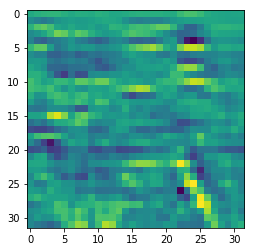

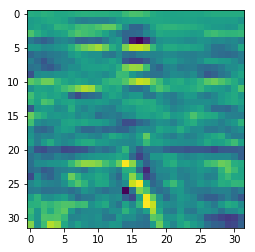

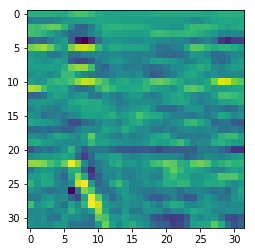

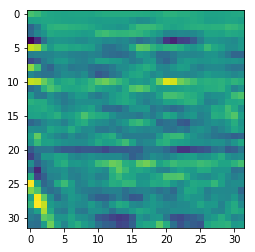

In [482]:
for _smpl in range(4):
    feature_img = tr_x[_smpl]
    plt.imshow(np.squeeze(feature_img).T)
    plt.show()

## For unbalanced dataset prepare class weights

In [471]:
w_cls = np.sum(tr_y, axis=0)
print(w_cls)
w_cls = 1/w_cls/np.linalg.norm(1/w_cls)
print(w_cls)

[33445.  5175. 58709. 16618.]
[0.1456439  0.94126768 0.08296957 0.29311952]


In [476]:
cls_weight = {i:w for i, w in enumerate(w_cls)}
cls_weight

{0: 0.14564390061079335,
 1: 0.9412676823049243,
 2: 0.08296956609596456,
 3: 0.29311952436683014}

## Prepare keras model and train

In [463]:
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

batch_size = 128
epochs=200

In [ ]:
model = Sequential()
model.add(Conv2D(64, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(32,32,1)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Dropout(0.4))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.9))
model.add(Dense(4, activation='softmax'))

saver = keras.callbacks.ModelCheckpoint('model_cnn4.h5', monitor='val_loss', verbose=0, save_best_only=True,
                                save_weights_only=False, mode='auto', period=1)

lron = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                  patience=5, min_lr=0.001)
model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(1e-3),
              metrics=['accuracy'])

model.fit(tr_x, tr_y,
          batch_size=batch_size,
          epochs=300,
          verbose=1,
          validation_data=(val_x, val_y),
          callbacks=[saver, lron],
          class_weight = cls_weight )
model.load_weights('model_cnn_v4.h5')
score = model.evaluate(tst_x, tst_y, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

## Keras classify

In [477]:
def classify_chunks_dnn(chunks, md, key):
    h = 0
    m = 0
    for _ds_feat in chunks:
        
        gt = cls_to_id[key]
        
        x = mat_2d_to_3d(_ds_feat, concat_frames, hopping_frames)
        x = np.expand_dims(x, axis=-1)
        pred = md.predict(x)
        
        pred_chunk = np.argmax(np.sum(pred, axis=0))

        if pred_chunk == gt:
            h+=1
        else:
            m+=1
    return h/(h+m)

In [478]:
md = keras.models.load_model("model_best.h5")

In [479]:
md.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 30, 30, 64)        640       
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 15, 15, 64)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 13, 13, 64)        36928     
_________________________________________________________________
dropout_11 (Dropout)         (None, 13, 13, 64)        0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 10816)             0         
_________________________________________________________________
dense_11 (Dense)             (None, 64)                692288    
_________________________________________________________________
dropout_12 (Dropout)         (None, 64)                0         
__________

### classify each test audio file

In [506]:
acc_lst = []

for key, val in test.items():
    print("KEY {}".format(key))
    for file in val:
        _ds_feat = get_features_lst([file])
        _ds_feat = sc.transform(_ds_feat) #pretrained scaler
        ctx_frames = np.array_split(_ds_feat, _ds_feat.shape[0]/CONTEXT_FEATURES_LEN)
        
        pred_score = classify_chunks_dnn(ctx_frames, model, key)
            
        acc_lst.append(pred_score)
        

KEY car
KEY using
KEY not-using
KEY activities


### List of performance and error

In [507]:
acc_lst

[1.0,
 1.0,
 1.0,
 0.4090909090909091,
 0.2826086956521739,
 0.8,
 1.0,
 0.9504132231404959]

In [508]:
np.mean(acc_lst) #mean accuracy [%]

0.8052641034854474